# Analyzing temperature changes globally (1985-2019)


The project aims to determine the impact of over-population, industrialization and the resulting global warming on earth. The project aims to showcase tabualted results in a much concise and appealing way. I have tried my best to cover each place from all parts of the world. The aim is to awaken human beings and showcase what human greed has done to this green planet over the years (1985-2019).
The tools used are:
1. Python
2. Pandas
3. Matplotlib
4. Seaborn
5. Numpy Arrays
6. Opendataset Library by Jovian

## Downloading the Dataset

Dataset Link: https://www.kaggle.com/datasets/sevgisarac/temperature-change

In [1]:
!pip install jovian opendatasets --upgrade --quiet

Let's begin by downloading the data, and listing the files within the dataset.

In [2]:
dataset_url = 'https://www.kaggle.com/datasets/sevgisarac/temperature-change'  

In [3]:
import opendatasets as od
od.download(dataset_url)

Skipping, found downloaded files in "./temperature-change" (use force=True to force download)


The dataset has been downloaded and extracted.

In [4]:
data_dir = 'temperature-change'

In [5]:
import os
os.listdir(data_dir)

['dataset.csv',
 'FAOSTAT_data_1-10-2022.csv',
 'FAOSTAT_data_11-24-2020.csv',
 '.ipynb_checkpoints']

Let us save and upload our work to Jovian before continuing.

In [6]:
project_name = "temperature-change-analysis"

In [7]:
!pip install jovian --upgrade -q

In [8]:
import jovian

In [9]:
jovian.commit(project=project_name)

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'

## Data Preparation and Cleaning

During the process of analyzing the data, I realized how all the countries from 1985 to 2019 would slow my analysis and make it difficult for me to visualize my results so I divided the timeline into a five-year gap which helped me analyze better. I further narrowed down the areas to a few known regions and places so that I could cover every major city as well as every part of the globe.
Steps followed were:
1. Clear out unwanted columns like area code, years, temperature scale etc.
2. Clear out excess rows with unwanted and excess places (places that won't make much of a difference)
3. Use better column names to help access column indexes.



In [8]:
import pandas as pd

In [9]:
raw_df = pd.read_csv('temperature-change/dataset.csv',encoding='cp1252')

In [10]:
raw_df
raw_df.columns = [c.replace(' ', '_') for c in raw_df.columns]

In [11]:
temp_change = (raw_df.Element == 'Temperature change' )
raw_df[temp_change]

,Area_Code,Area,Months_Code,Months,Element_Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2010,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019
0,2,Afghanistan,7001,January,7271,Temperature change,°C,0.777,0.062,2.744,...,3.601,1.179,-0.583,1.233,1.755,1.943,3.416,1.201,1.996,2.951
2,2,Afghanistan,7002,February,7271,Temperature change,°C,-1.743,2.465,3.919,...,1.212,0.321,-3.201,1.494,-3.187,2.699,2.251,-0.323,2.705,0.086
4,2,Afghanistan,7003,March,7271,Temperature change,°C,0.516,1.336,0.403,...,3.390,0.748,-0.527,2.246,-0.076,-0.497,2.296,0.834,4.418,0.234
6,2,Afghanistan,7004,April,7271,Temperature change,°C,-1.709,0.117,0.919,...,2.591,1.712,1.417,-0.052,0.585,1.589,0.980,1.252,1.442,0.899
8,2,Afghanistan,7005,May,7271,Temperature change,°C,1.412,-0.092,-0.690,...,1.419,3.643,0.909,1.201,0.959,1.862,3.246,3.280,0.855,0.647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9646,5873,OECD,7016,Dec–Jan–Feb,7271,Temperature change,°C,0.561,-0.362,-0.222,...,1.272,0.770,1.709,1.327,0.686,1.307,2.636,1.884,1.453,1.527
9648,5873,OECD,7017,Mar–Apr–May,7271,Temperature change,°C,-0.038,-0.189,0.141,...,1.742,0.390,1.442,0.475,0.778,1.191,1.928,1.237,1.241,1.352
9650,5873,OECD,7018,Jun–Jul–Aug,7271,Temperature change,°C,0.101,0.052,-0.047,...,1.012,0.954,1.061,1.119,0.779,0.958,1.303,1.081,1.078,1.078
9652,5873,OECD,7019,Sep–Oct–Nov,7271,Temperature change,°C,0.036,0.461,0.665,...,0.958,1.106,0.885,1.041,0.999,1.670,1.535,1.194,0.581,1.233


In [12]:
Places = raw_df.sort_values('Area_Code',ascending=True).Area.unique()
Places

array(['Armenia', 'Afghanistan', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina',
       'Australia', 'Austria', 'Bahamas', 'Bahrain', 'Barbados',
       'Belgium-Luxembourg', 'Bangladesh', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Botswana', 'Brazil', 'Aruba',
       'Belize', 'Solomon Islands', 'Brunei Darussalam', 'Bulgaria',
       'Myanmar', 'Burundi', 'Antarctica', 'Cameroon', 'Canada',
       'Cabo Verde', 'Cayman Islands', 'Central African Republic',
       'Sri Lanka', 'Chad', 'Chile', 'China, mainland',
       'Christmas Island', 'Cocos (Keeling) Islands', 'Colombia',
       'Comoros', 'Congo', 'Cook Islands', 'Costa Rica', 'Cuba', 'Cyprus',
       'Czechoslovakia', 'Azerbaijan', 'Benin', 'Denmark', 'Dominica',
       'Dominican Republic', 'Belarus', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Ethiopia PDR', 'Estonia', 'Faroe Islands',
       'Falkland Islands (Malvinas)', 'Fiji', 'Finland'

In [13]:
raw_df2 = raw_df.groupby('Area_Code').apply(lambda x: x.mean())
raw_df2['Area']=Places
raw_df2

/tmp/ipykernel_737/1402133844.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  raw_df2 = raw_df.groupby('Area_Code').apply(lambda x: x.mean())


,Area_Code,Months_Code,Element_Code,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Area
Area_Code,,,,,,,,,,,,,,,,,,,,,
1,1.0,7009.882353,6674.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.373471,1.411588,1.183353,1.723824,1.794059,1.261706,1.285000,2.868118,1.884647,Armenia
2,2.0,7009.882353,6674.5,0.607853,0.495147,1.038235,0.141059,0.567971,0.704941,0.412794,...,1.216941,0.683765,1.219735,0.837382,1.143029,1.429824,1.247265,1.381235,1.043676,Afghanistan
3,3.0,7009.882353,6674.5,0.781912,0.664765,0.672618,0.446735,0.364500,0.775441,0.506118,...,1.114176,1.301912,1.316147,1.278559,1.390029,1.353294,1.253559,1.648500,1.559794,Albania
4,4.0,7009.882353,6674.5,0.559265,0.423088,0.496647,0.436500,0.377059,0.568441,0.371912,...,1.085382,1.037647,1.020441,1.294500,1.050853,1.363618,1.167529,1.110412,1.053000,Algeria
5,5.0,7009.882353,6674.5,0.166853,0.128324,0.229559,0.043559,-0.025382,0.247971,-0.004853,...,0.607300,0.649333,0.763433,0.718231,0.596538,0.958192,0.811269,0.735577,0.908731,American Samoa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5815,5815.0,7009.882353,6674.5,0.081441,0.105118,0.207000,0.054471,0.060824,0.220500,0.058735,...,0.588294,0.498206,0.607853,0.582735,0.699971,0.850176,0.789735,0.716588,0.797765,Low Income Food Deficit Countries
5817,5817.0,7009.882353,6674.5,0.117147,0.133118,0.211529,0.040382,0.084059,0.221794,0.035176,...,0.576412,0.516794,0.650088,0.647882,0.792706,0.865265,0.790294,0.763853,0.870147,Net Food Importing Developing Countries
5848,5848.0,7009.882353,6674.5,0.438000,0.333765,0.316529,0.063647,0.102235,0.355441,0.254794,...,0.850971,0.939618,0.854294,0.830882,1.090382,1.225147,1.104176,0.929412,1.097118,Annex I countries


In [14]:
raw_df2.columns

Index(['Area_Code', 'Months_Code', 'Element_Code', 'Y1961', 'Y1962', 'Y1963',
       'Y1964', 'Y1965', 'Y1966', 'Y1967', 'Y1968', 'Y1969', 'Y1970', 'Y1971',
       'Y1972', 'Y1973', 'Y1974', 'Y1975', 'Y1976', 'Y1977', 'Y1978', 'Y1979',
       'Y1980', 'Y1981', 'Y1982', 'Y1983', 'Y1984', 'Y1985', 'Y1986', 'Y1987',
       'Y1988', 'Y1989', 'Y1990', 'Y1991', 'Y1992', 'Y1993', 'Y1994', 'Y1995',
       'Y1996', 'Y1997', 'Y1998', 'Y1999', 'Y2000', 'Y2001', 'Y2002', 'Y2003',
       'Y2004', 'Y2005', 'Y2006', 'Y2007', 'Y2008', 'Y2009', 'Y2010', 'Y2011',
       'Y2012', 'Y2013', 'Y2014', 'Y2015', 'Y2016', 'Y2017', 'Y2018', 'Y2019',
       'Area'],
      dtype='object')

In [15]:
selected_columns = ['Area_Code', 'Y1980','Y1985', 'Y1990','Y1995','Y2000','Y2005','Y2010', 'Y2015','Y2019',
       'Area']
selected_places = ['Afghanistan', 'Argentina','Australia','Botswana', 'Brazil', 'Antarctica', 'Canada',
       'Sri Lanka', 'Chile', 'China, mainland',
       'Colombia',
       'Costa Rica','Azerbaijan','Egypt','Finland', 'France',
       'Germany', 'Greece', 'Greenland', 'China', 'Hungary', 'Croatia',
       'Iceland', 'India', 'Iran (Islamic Republic of)',
       'Iraq', 'Israel', 'Italy','Jamaica', 'Japan',"Democratic People's Republic of Korea", 'Kuwait','Madagascar',
       'Malaysia', 'Mexico',
       'New Zealand', 'Norway','Peru', 'Philippines','Poland', 'Portugal','Puerto Rico','Qatar',
       'Zimbabwe', 'Russian Federation',
       'Saudi Arabia','South Africa', 'Spain',
       'Switzerland',
       'Thailand','Turkey',
       'United Arab Emirates',
       'United Kingdom', 'Ukraine', 'United States of America',
     ]

In [16]:
final_df1 = raw_df2[selected_columns]
final_df = final_df1.loc[final_df1['Area'].isin(['Afghanistan', 'Argentina','Australia','Botswana', 'Brazil', 'Antarctica', 'Canada',
       'Sri Lanka', 'Chile', 'China, mainland',
       'Colombia',
       'Costa Rica','Azerbaijan','Egypt','Finland', 'France',
       'Germany', 'Greece', 'Greenland', 'China', 'Hungary', 'Croatia',
       'Iceland', 'India', 'Iran (Islamic Republic of)',
       'Iraq', 'Israel', 'Italy','Jamaica', 'Japan',"Democratic People's Republic of Korea",'Madagascar',
       'Malaysia', 'Mexico',
       'New Zealand', 'Norway','Peru', 'Philippines','Poland', 'Portugal','Puerto Rico','Qatar',
       'Zimbabwe', 'Russian Federation',
       'Saudi Arabia', 'Singapore','South Africa', 'Spain',
       'Switzerland',
       'Thailand','Turkey',
       'United Arab Emirates',
       'United Kingdom', 'Ukraine', 'United States of America',
     ])]

In [17]:
final_df

,Area_Code,Y1980,Y1985,Y1990,Y1995,Y2000,Y2005,Y2010,Y2015,Y2019,Area
Area_Code,,,,,,,,,,,
2,2.0,0.889676,0.797676,0.903500,0.749176,1.085324,0.807147,1.343500,1.143029,1.043676,Afghanistan
9,9.0,0.588706,0.603794,0.573971,0.515176,0.284147,0.481706,0.461471,0.873441,0.761941,Argentina
10,10.0,0.716294,0.449706,0.579176,0.439588,0.389676,0.889471,0.585088,0.834735,1.047382,Australia
20,20.0,0.379294,0.535706,0.807765,0.975559,0.181294,1.014735,0.988000,1.369706,1.259853,Botswana
21,21.0,0.314794,0.230941,0.416529,0.570676,0.448029,0.754147,0.760324,1.045853,1.021794,Brazil
30,30.0,1.010971,0.659000,0.837824,0.591441,0.387647,1.158029,1.087059,0.618412,0.962912,Antarctica
33,33.0,0.909441,0.573059,0.606971,0.971059,1.117882,1.381353,2.112412,1.217588,1.222500,Canada
38,38.0,0.395088,0.281059,0.502588,0.512912,0.478941,0.616206,0.689735,0.673676,0.786235,Sri Lanka
40,40.0,0.396794,0.403353,0.318618,0.209706,0.112059,0.286412,0.185471,0.605794,0.475294,Chile


In [18]:
data_1980 = final_df.sort_values('Y1980',ascending = False).head(10)
data_1990 = final_df.sort_values('Y1990',ascending = False).head(10)
data_2000 = final_df.sort_values('Y2000',ascending = False).head(10)
data_2010 = final_df.sort_values('Y2010',ascending = False).head(10)
data_2019 = final_df.sort_values('Y2019',ascending = False).head(10)

In [23]:
import jovian

In [24]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'

## Exploratory Analysis and Visualization

On observing the fist linechart, one can clearly see how the temperature changes have nearly doubled since 1985 showing us how rapid uncontrolled industrialization has affected us. The plots following this plot show the country wise rise in temperature over years. The first plot cover the time period from 1985 to 2000 and the next one covers 2000 to 2019. The graphs further down give a better visualization.


Let's begin by importing`matplotlib.pyplot` and `seaborn`.

In [19]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('whitegrid')
matplotlib.rcParams['font.size'] = 80
matplotlib.rcParams['figure.figsize'] = (200,100)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

**TODO** - Explore one or more columns by plotting a graph below, and add some explanation about it

In [23]:
plt.xticks(rotation = 75)
plt.xlabel('Places arond the earth',fontsize=100)
plt.ylabel('Temperature Change',fontsize=100)
plt.plot(final_df.Area,final_df.Y1985,'r-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='red')
plt.plot(final_df.Area,final_df.Y2000,'b-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='blue')

In [23]:
plt.xticks(rotation = 75)
plt.xlabel('Places arond the earth',fontsize=100)
plt.ylabel('Temperature Change',fontsize=100)
plt.plot(final_df.Area,final_df.Y1985,'r-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='red')
plt.plot(final_df.Area,final_df.Y2000,'b-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='blue')
plt.plot(final_df.Area,final_df.Y2019,'y-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='yellow')


In [23]:
plt.xlabel('Places arond the earth',fontsize=100)
plt.ylabel('Temperature Change',fontsize=100)
plt.xticks(rotation = 75)
plt.plot(final_df.Area,final_df.Y1985,'r-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='red')
plt.plot(final_df.Area,final_df.Y2000,'k-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='black')
sns.barplot(x=final_df.Area,y=final_df.Y1985,color='r')
sns.barplot(x=final_df.Area,y=final_df.Y1990,color='g',alpha = 0.6)
sns.barplot(x=final_df.Area,y=final_df.Y1995,color='b',alpha = 0.2)
sns.barplot(x=final_df.Area,y=final_df.Y2000,color='y',alpha = 0.4)

<AxesSubplot:xlabel='Area', ylabel='Y2000'>

In [23]:
plt.xticks(rotation = 75)
sns.barplot(x=final_df.Area,y=final_df.Y2005,color='r')
plt.plot(final_df.Area,final_df.Y1985,'c-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='red')
plt.plot(final_df.Area,final_df.Y2000,'g-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='green')
plt.plot(final_df.Area,final_df.Y2019,'k-o', linewidth=8, markersize=50, markeredgewidth=4, markeredgecolor='black')
sns.barplot(x=final_df.Area,y=final_df.Y2010,color='g',alpha = 0.6)
sns.barplot(x=final_df.Area,y=final_df.Y2015,color='b',alpha = 0.2)
sns.barplot(x=final_df.Area,y=final_df.Y2019,color='y',alpha = 0.4)

<AxesSubplot:xlabel='Area', ylabel='Y2019'>

### Crowded visualizations
Even after manually filtering the dataset to limited places, the visualizations above don't make much sense. In order to visualize better, I have further divided the dataset to five different sets of years: 1980, 1990, 2000, 2010 and 2019 and have picked up the top ten countries with the most drastic temperature change differences. Let's go ahead and see the visualizations through a bar plot.

#### Graph of 1980
The graph shows the top ten places to be affected by climate change in the year 1980. Greenland is shown to have a delta(T) of about 1.0 °C. Other places include Antarctica which even today faces a threat due to global warming. This can be noticed from the glaciers melting, sea-level rising etc. Places like Canada, Afghanistan have also seen significant rise in the temperatures.

<AxesSubplot:xlabel='Area', ylabel='Y1980'>

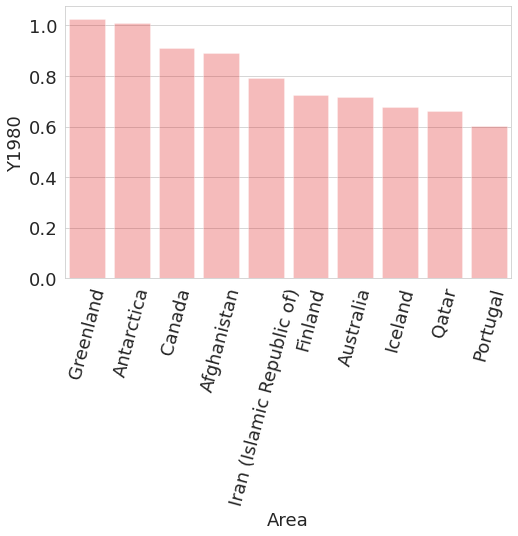

In [27]:
matplotlib.rcParams['figure.figsize'] = (8,5)
matplotlib.rcParams['font.size'] = 18
plt.xticks(rotation = 75)
sns.barplot(x=data_1980.Area,y=data_1980.Y1980,color='r',alpha = 0.3)

#### Graph of 1990
The graph shows the top ten places to be affected by climate change in the year 1990. Finland is shown to have a delta(T) of about 1.75 °C, which is alarming. Other places that include Poland, Norway, Germany and Switzerland have also seen significant rise in the temperatures.

<AxesSubplot:xlabel='Area', ylabel='Y1990'>

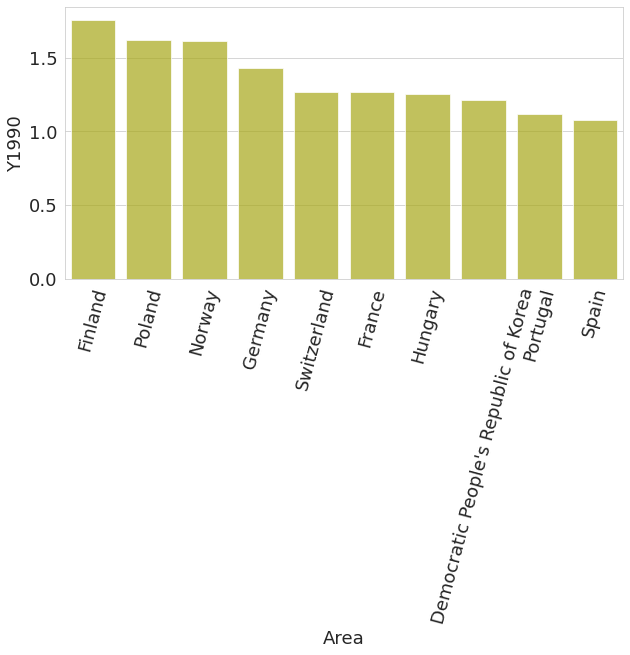

In [36]:
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['font.size'] = 18
plt.xticks(rotation = 75)
sns.barplot(x=data_1990.Area,y=data_1990.Y1990,color='y',alpha = 0.7)

#### Graph of 2000
The graph shows the top ten places to be affected by climate change in the year 2000. Finland continues to top the maximum temperature change and is shown to have a delta(T) of about >2.0 °C, which is alarming and much higher than the previous 1.75 °C. Other places that include Poland, Norway, Croatia, Hungary, Ukraine have also seen significant rise in the temperatures.

<AxesSubplot:xlabel='Area', ylabel='Y2000'>

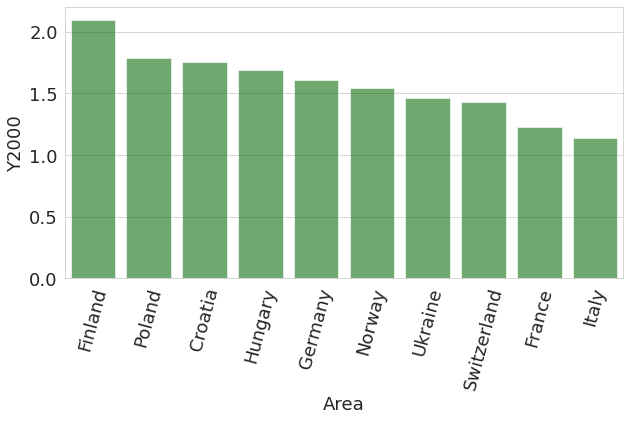

In [40]:
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['font.size'] = 18
plt.xticks(rotation = 75)
sns.barplot(x=data_2000.Area,y=data_2000.Y2000,color='g',alpha = 0.6)

#### Graph of 2010
The graph shows the top ten places to be affected by climate change in the year 2010. Azerbaijan, makes a new entry to the charts with the maximum temperature change and is shown to have a delta(T) of about 2.5 °C, which is alarming and much higher. Other places that include Greenland, Norway, Iraq (possible due to post-war outcomes), Turkey, Ukraine have also seen significant rise in the temperatures.

<AxesSubplot:xlabel='Area', ylabel='Y2010'>

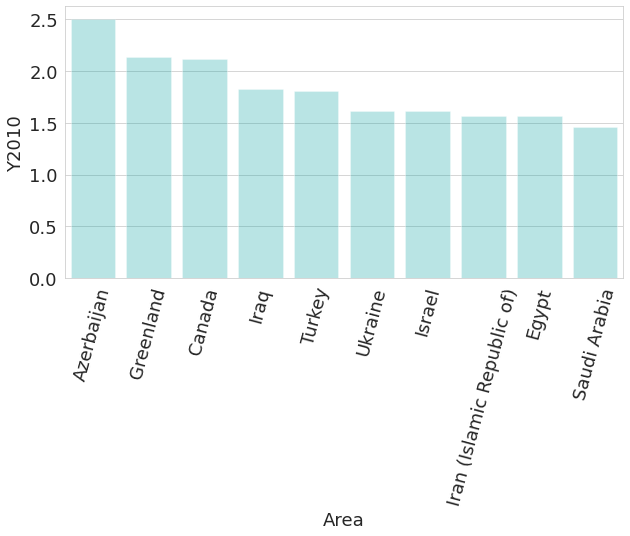

In [42]:
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['font.size'] = 18
plt.xticks(rotation = 75)
sns.barplot(x=data_2010.Area,y=data_2010.Y2010,color='c',alpha = 0.3)

#### Graph of 2019
The graph shows the top ten places to be affected by climate change in the year 2019. Ukraine, which was slowly starting to come near the top finally recorded a maximum temperature change and is shown to have a delta(T) of about >2.5 °C, which is alarming and much higher. Other places that include Poland, Norway, Croatia, Hungary,Finland have also seen significant rise in the temperatures.

<AxesSubplot:xlabel='Area', ylabel='Y2019'>

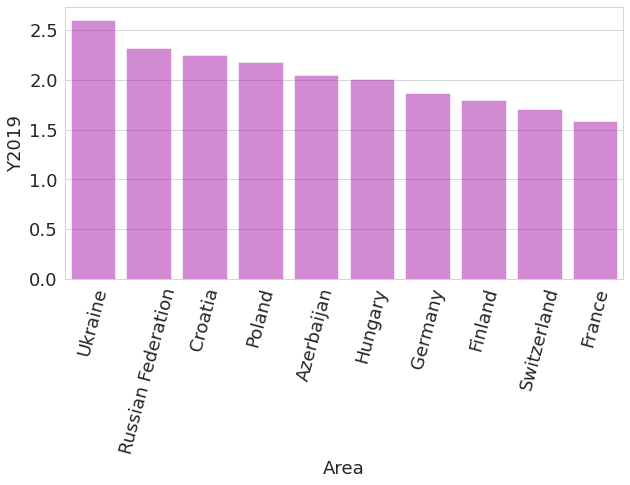

In [46]:
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['font.size'] = 18
plt.xticks(rotation = 75)
sns.barplot(x=data_2019.Area,y=data_2019.Y2019,color='m',alpha = 0.5)

### Subplot of ΔT [1990 - 2000 - 2010 - 2019]
The graph shows a cummulative plot of over the years from 1990 to 2019 with a ten year gap between each plot. The aim is to visualize the results in a better way and see the changes over years in a concise way.

Text(0.5, 1.0, '2019')

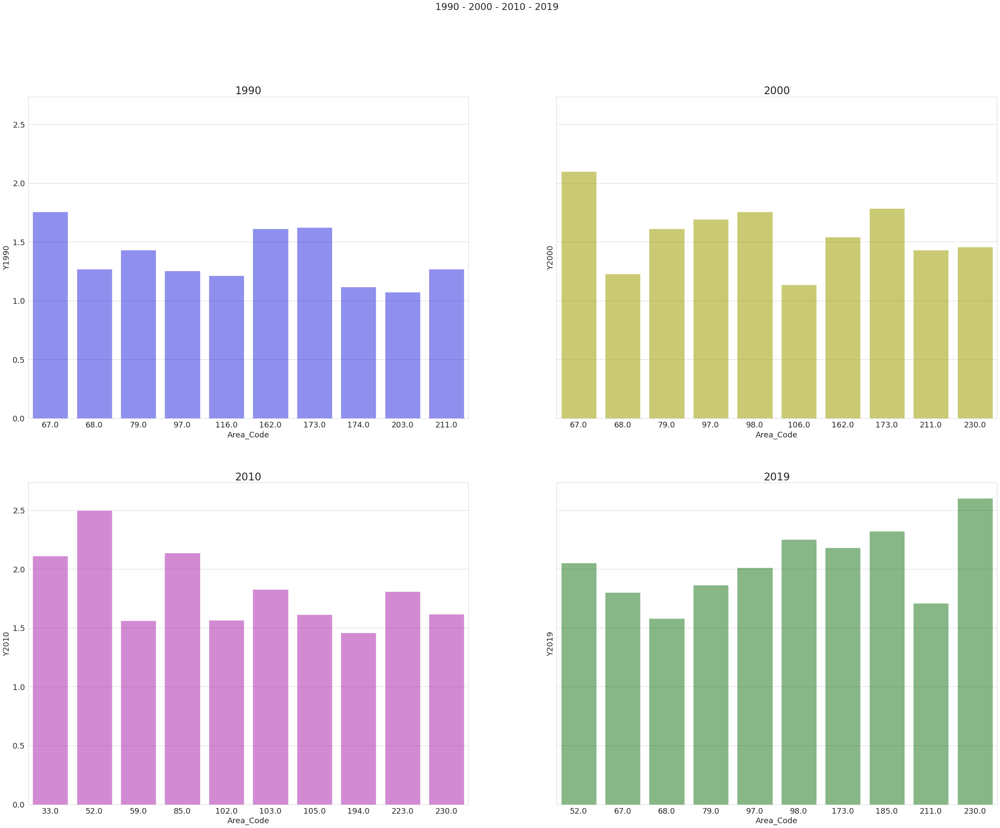

In [36]:
fig, axes = plt.subplots(2, 2, figsize=(40, 30), sharey=True)
fig.suptitle('1990 - 2000 - 2010 - 2019')
matplotlib.rcParams['font.size'] = 20

sns.barplot(ax=axes[0][0], x=data_1990.Area_Code, y=data_1990.Y1990, color = 'b', alpha = 0.5)
axes[0][0].set_title('1990') 


sns.barplot(ax=axes[0][1], x=data_2000.Area_Code, y=data_2000.Y2000, color = 'y', alpha = 0.6)
axes[0][1].set_title('2000')


sns.barplot(ax=axes[1][0], x=data_2010.Area_Code, y=data_2010.Y2010, color = 'm', alpha = 0.5)
axes[1][0].set_title('2010')


sns.barplot(ax=axes[1][1], x=data_2019.Area_Code, y=data_2019.Y2019, color = 'g', alpha = 0.5 )
axes[1][1].set_title('2019')



### Legend for reader's aid

In [20]:
# for reader's reference
legend = final_df[['Area_Code', 'Area']]
legend

,Area_Code,Area
Area_Code,,
2,2.0,Afghanistan
9,9.0,Argentina
10,10.0,Australia
20,20.0,Botswana
21,21.0,Brazil
30,30.0,Antarctica
33,33.0,Canada
38,38.0,Sri Lanka
40,40.0,Chile


### Analyzing India over the years
I come from the India and below is the analysis for my country over the years.

In [21]:
temp_india = final_df.loc[final_df['Area']=='India']
india_columns = ['Y1980', 'Y1985', 'Y1990', 'Y1995', 'Y2000', 'Y2005',
       'Y2010', 'Y2015', 'Y2019']
india = temp_india[india_columns]
india

,Y1980,Y1985,Y1990,Y1995,Y2000,Y2005,Y2010,Y2015,Y2019
Area_Code,,,,,,,,,
100,0.440853,0.337676,0.201294,0.344647,0.402118,0.471912,0.734676,0.580206,0.596059


#### Conclusions from the Indian plot
The plot below shows the ΔT in India over the years from 1980 to 2019. The temperature changes started increasing during 1990 and had a peak till 2010, the year we hosted the commonwealth games. Strict policies and further rules and regulations helped us see a drop in ΔT in 2015 but soon a rise was again recorded in 2019.

<AxesSubplot:title={'center':'India over the years'}, xlabel='Years', ylabel='ΔT'>

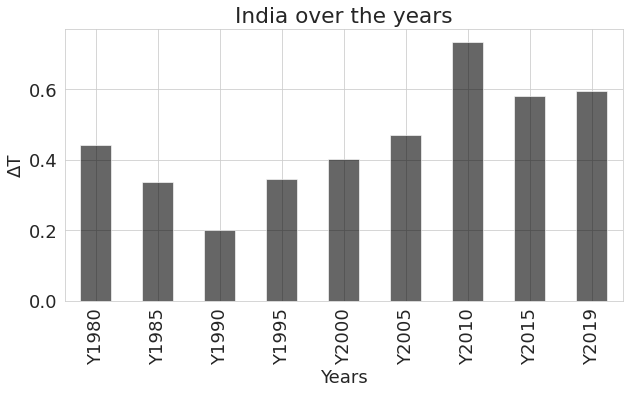

In [38]:
row = india.iloc[0]
plt.title('India over the years')
plt.xlabel('Years')
plt.ylabel('ΔT')
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['font.size'] = 18
row.plot(kind='bar', color = 'k', alpha = 0.6)

Let us save and upload our work to Jovian before continuing

In [24]:
import jovian

In [25]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'

## Asking and Answering Questions




#### Q1: What information does this analysis aim to gather?


The main motive of this project is to determine the change in temperature for each place mentioned in the dataset. I have tried my best to cover each place from a continent and all parts of the globe. The aim is to awaken human beings and show what industrialization has done to this green planet over the years (1985-2019)

#### Q2: What agenda did I use to clean and prepare my data for analysis?

During the process of analyzing the data, I realized how all the countries from 1985 to 2019 would slow my analysis and make it difficult for me to visualize my results so I divided the timeline into a five-year gap which helped me analyze better. I further narrowed down the areas to a few known regions and places so that I could cover every major city as well as every part of the globe.
Steps followed were:
1. Clear out unwanted columns like area code, years, temperature scale etc.
2. Clear out excess rows with unwanted and excess places (places that won't make much of a difference)
3. Use better column names to help access column indexes.
4. Consolidated top ten countries for every year to display better and understandable plots of ΔT.

#### Q3: What were some conclusions drawn?

On observing the fist linechart, one can clearly see how the temperature changes have nearly doubled since 1985 showing us how rapid uncontrolled industrialization has affected us. The plots following this plot show the country wise rise in temperature over years. 

1. The first plot cover the time period from 1985 to 2000 and the next one covers 2000 to 2019.
2. Further analysis of 1990 - 2000 - 2010 - 2019 shows the ΔT rising in different countries through a bar plot. 
3. In the end, a collective sub-plot is shown to draw decent judgements from the four plots. Conclusions where necessary, have been drawn just before the plot.
4. I have also shown the analysis of India in the end and have drawn a few conclusions too.

The observations drawn are something to worry about.

#### Q4: Any specific remarks?

I would like to mention how this dataset though tough to analyze considering the size, can be analyzed in a much better and efficient way and I would keep improving it as I keep learning new data visualization techniques in the future. Better graphs and visual representations can be drawn from the dataset.

In [27]:
import jovian

In [28]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'

## Inferences and Conclusion

The project aims to determine the impact of over-population, industrilization and the resulting global warming on earth. The results are something to worry about. Places like Ukraine, Finland, Azerbaijan have shown alarming rise in ΔT over the years. The project aims to showcase the same results but in a much concise and appealing way.  It is high time we start focusing on this issue and take measures to control temperature changes across the globe.

In [29]:
import jovian

In [30]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'

## References and Future Work

Dataset Link: https://www.kaggle.com/datasets/sevgisarac/temperature-change

In [39]:
import jovian

In [40]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "f20191452/temperature-change-analysis" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/f20191452/temperature-change-analysis


'https://jovian.ai/f20191452/temperature-change-analysis'